## 10-plex spectral unmixing matrix construction using zebrafish image data

#### Preliminary imports

Each used package must be imported into a notebook manually. Here, we will import `matplotlib` for plotting, `xarray` for data array types, `numpy` for basic numerics, `pandas` for table functionality, and the imaging package `hcr_imaging` (aliased as `im`) for image-related functionality.

In [11]:
import matplotlib.pyplot as plt, xarray as xa, numpy as np, pandas as pd
import hcr_imaging as im

It is useful to set up some sensible defaults for image display, including color palettes, styling, and to enable the `bokeh` Python package to output images into the notebook in an inline fashion.

This is done with the `configure_notebook()` function.

In [12]:
im.configure_notebook()

Loading BokehJS ...

## Loading the image

Next, we will load the image to analyze using the `load()` function. Supported project file formats include `.czi`, `.lif`, and `.tif`.  For additional formats, or for help analyzing a file you have with different formatting conventions, contact our support and attach an example image that you want to analyze.

Generally speaking, raw image data is loaded as an `xarray.DataArray` with suitable `xyz` dimensions and coordinates.  `l` is used along with `x`, `y`, and `z` as an abbreviation to index wavelength or channel.

The file name of the input image is specified here. You may need to supply the directory path in this name if the input image is not in the current working directory.

#### Additional explanation for new users

For analyzing your own images, replace `zebrafish-10-plex.lif` with your image file name, e.g. `zebrafish-10-plex.lif`. If that image is not in the current working directory, specify its path (for example, perhaps `/Users/my-name/Downloads/zebrafish-10-plex.lif` in macOS). For day to day operation, you can simply enter your file name including the extension (.czi, .lif or .tif) to work directly from saved file without changing the name. If you would like to save the notebook separately to store the record of your image analysis, you can select `Save Notebook As...` from the File menu in JupyterLab. You can choose a different notebook to open using the file browser on the left-hand side of the JupyterLab interface.


In [13]:
lif = im.load('zebrafish-10-plex.lif')

A `.lif` file may contain multiple images, so the ones to analyze must be selected.

In [14]:
print('Images in lif file:')
for i, l in enumerate(lif):
    print('%3d: %r' % (i, l))

Images in lif file:
  0: '10-plex-rep1'
  1: 'FrameProperties'
  2: '10-plex-rep2'
  3: '10-plex-rep3'
  4: '405'
  5: '425'
  6: '488'
  7: '514'
  8: '546'
  9: '594'
 10: '633'
 11: '700'
 12: '750'
 13: '800'
 14: 'autofluorescence'
 15: '10-plex-rep1_DyeSep001'
 16: '10-plex-rep2_DyeSep001'
 17: '10-plex-rep3_DyeSep001'


## Analyzing the reference spectra

Our desired reference images are found in the above list:

1. 405
2. 425
3. 488
4. 514
5. 546
6. 594
7. 633
8. 700
9. 750
10. 800
11. autofluorescence

Let's start with the first reference image, 405.

In [15]:
image_name = '405'
img = im.open_lif_series(lif[image_name], name=image_name)

We can view the image stack for this reference image in the following way. The graphical selection dropdown can be used to switch between excitation and detector settings. In this experiment, there are a total of 26 different excitation and detector settings.

In [16]:
p = im.figure('dark', shape=(600, 600), title='channels')
sliders = im.gui.show_xy(p, im.max_z(img).transpose(*'lxy'))
im.gui.disp(im.gui.column(*sliders, p))

Now, we could generate our unmixing matrix by slicing out the pixels within a given user-defined box around the signal in reference sample. That approach is used in the LasX software (see S2.1.4 of Schulte et al. 2024). On the other hand, here we will try just slicing out the top 0.1% of pixels and comparing the result spectra to the LasX generated matrix.

In [17]:
channel_names = ['405', '425', '488', '514', '546', '594', '633', '700', '750', '800', 'autofluorescence']
unmixing_matrix = []

for i, ch in enumerate(channel_names):
    img = im.open_lif_series(lif[ch], name=ch) # Open the given channel
    transposed = img.transpose(*'xyzl')
    summed = transposed.sum('l') # Sum each pixel's intensity across every excitation and detector setting

    top_pixels = transposed.values[np.where(summed >= np.percentile(summed, 99.9))] # Take the tope 0.1% of pixels by this summed value
    mean_spectrum = top_pixels.mean(0) # Take the mean spectrum from these pixels
    unmixing_matrix.append(mean_spectrum / np.linalg.norm(mean_spectrum)) # Add normalized spectrum to the results
    
unmixing_matrix = np.array(unmixing_matrix).T # Convert the result into a numpy ndarray

To save the result unmixing matrix, one may use the following command. Then it may be loaded for unmixing in another notebook (like `zebrafish-unmixing-example.ipynb`) via `A = im.load('zebrafish-unmixing-matrix.npy')`.

In [18]:
np.save('zebrafish-unmixing-matrix.npy', unmixing_matrix)

For comparison, we can also load the matrix from LasX which was generated by hand-tuned bounds on the signal locations of the reference spectrum. This is optional! You do not need to run this comparison if you do not have the sdm file (which only LasX creates).

In [19]:
lasx_matrix = im.load('zebrafish-10-plex-matrix.sdm') # Load the LasX unmixing matrix
lasx_matrix /= np.linalg.norm(lasx_matrix, axis=0) # Normalize the spectrum for each channel

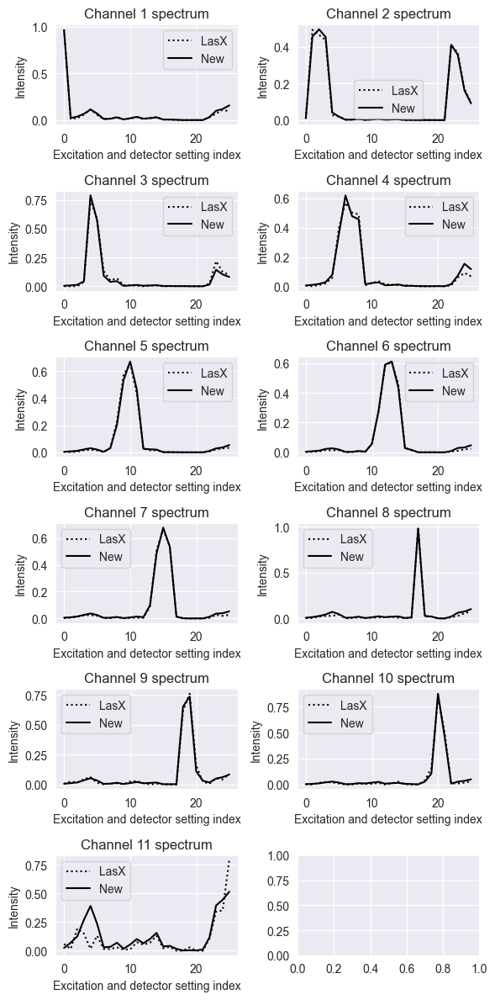

In [20]:
fix, axes = plt.subplots(6, 2, figsize=(6, 12))
for i, (r, a, ax) in enumerate(zip(lasx_matrix.T, unmixing_matrix.T, axes.ravel())): # Iterate through the different spectra
    ax.set_title('Channel %d spectrum' % (i+1))
    ax.plot(r, label='LasX', color='k', ls=':')
    ax.plot(a, label='New', color='k', ls='-')
    ax.legend()
    ax.set_xlabel('Excitation and detector setting index')
    ax.set_ylabel('Intensity')
plt.tight_layout()

The spectra obtained from the two approaches are altogether very similar. A modest amount of deviation is observed in the autofluorescence channel, probably because the autofluorescence spectrum is moderately heterogeneous across the sample.